In [1]:
import openmc
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize
from matplotlib.colors import LogNorm

import numpy as np

In [2]:
with openmc.StatePoint('statepoint.500.h5') as sp:
    thermal_flux_tally = sp.get_tally(name='thermal_flux_tally')
    energy_spectrum = sp.get_tally(name= 'energy spectrum')
    kinetics_parameters = sp.get_tally(name= 'kinetics parameters')
    epithermal_flux_tally = sp.get_tally(name='epithermal_flux_tally')

In [3]:
flux = kinetics_parameters.get_slice(scores=['flux'])
fission = kinetics_parameters.get_slice(scores=['fission'])
nu_fission = kinetics_parameters.get_slice(scores=['nu-fission'])
delayed_fission = kinetics_parameters.get_slice(scores=['delayed-nu-fission'])
kappa_fission = kinetics_parameters.get_slice(scores=['kappa-fission'])
prompt_fission = kinetics_parameters.get_slice(scores=['prompt-nu-fission'])
heating = kinetics_parameters.get_slice(scores=['heating'])
recoverable = kinetics_parameters.get_slice(scores=['fission-q-recoverable'])
thermal_flux = thermal_flux_tally.get_slice(scores=['flux'])
epithermal_flux = epithermal_flux_tally.get_slice(scores=['flux'])

In [4]:
import numpy as np
flux_value = flux.mean[0][0][0]
fission_value = fission.mean[0][0][0]
nu_fission_value = nu_fission.mean[0][0][0]
delayed_fission_value = delayed_fission.mean[0][0][0]
kappa_fission_value = kappa_fission.mean[0][0][0]
prompt_fission_value = prompt_fission.mean[0][0][0]
heating_value = heating.mean[0][0][0]
recoverable_value = recoverable.mean[0][0][0]

print(f'flux = {flux_value}\nfission = {fission_value}\nnu-fission = {nu_fission_value}\ndelayed fission = {delayed_fission_value}\n'
      f'kappa fission = {kappa_fission_value}\nprompt fission = {prompt_fission_value}\nheating = {heating_value}\nrecoverable = {recoverable_value}')

flux = 73.96380305430925
fission = 0.41105082207044047
nu-fission = 0.9995545709556308
delayed fission = 0.006556351252759163
kappa fission = 79506352.3247484
prompt fission = 0.9929981084984664
heating = 73688474.46135616
recoverable = 79775186.01264437


The flux tally is flattened, which means that even though the mesh was of size (3000, 2100, 1), it will be converted to (3000 * 2100, 1, 1), this is a way to preserve some memory and reduce computational expense by OpenMC, so we need to reshape it back to what it used to be, but due to the way it has been flattened, the way to reshape it is through (2100, 3000, 1) not (3000, 2100, 1)

The flux tally is in units n-cm, so it is practically the cumulative unit length all neutrons traveling inside a specific mesh, of course this unit is not useful at all, we want to convert it to n/cm^2-s, in order to do so, we follow the mathematical approach bellow.

The unit volume is simply the volume of each mesh
The power is assumed to be full power which is 100 kW
Kappa fission is the average energy released by fission and captured by the system, deducting the 10 MeV of the neutrino, it then comes down to about 190 MeV, it is converted to Joules

In [5]:
epithermal_flux.mean.shape = (2100, 3000, 1)
thermal_flux.mean.shape = (2100, 3000, 1)
nu = (delayed_fission_value + prompt_fission_value) / fission_value
volume = (300/3000) * (210/2100) * 60
power = 100000
kappa_fission = (kappa_fission_value * (1.60217663e-19)) / fission_value # multiplying by e to convert from eV to J
source_rate = (nu * power / kappa_fission)
normalized_thermal_flux = (thermal_flux.mean / volume) * source_rate
normalized_epithermal_flux = (epithermal_flux.mean / volume) * source_rate

In [21]:
print(f'Maximum thermal (0 - 0.625 eV) flux =  {np.max(normalized_thermal_flux):.2e} n/cm^2-s')
print(f'\nMaximum epithermal (0.625 eV - 10 keV) flux =  {np.max(normalized_epithermal_flux):.2e} n/cm^2-s')
print(f'\nAverage number of neutrons emitted per fission =  {nu:.5} n/fission')

Maximum thermal (0 - 0.625 eV) flux =  1.59e+12 n/cm^2-s

Maximum epithermal (0.625 eV - 10 keV) flux =  9.09e+11 n/cm^2-s

Average number of neutrons emitted per fission =  2.4317 n/fission


Text(0, 0.5, 'y [cm]')

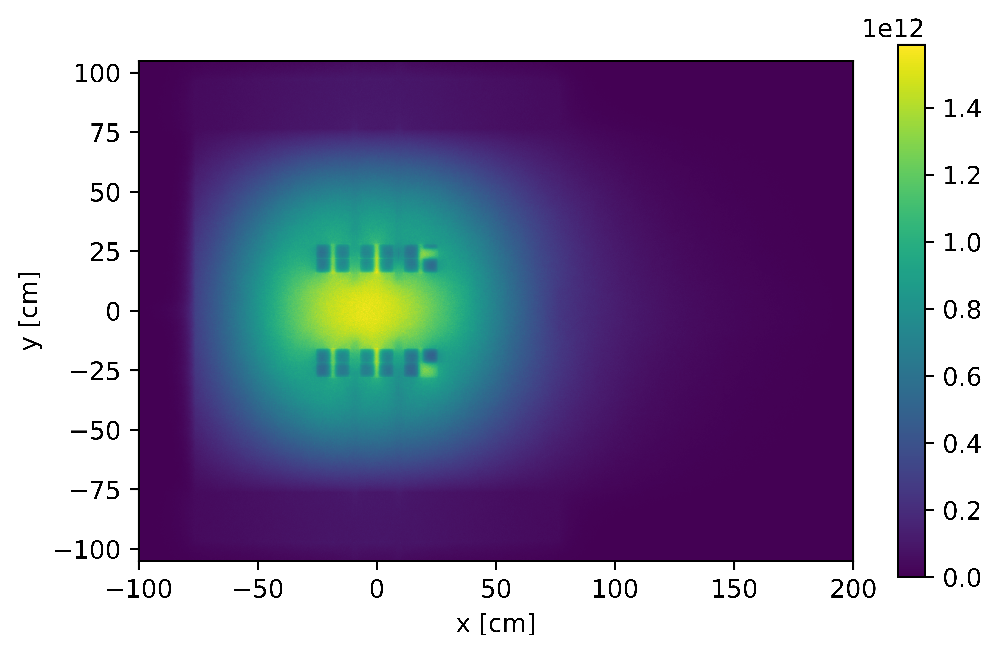

In [6]:
fig = plt.figure(dpi=1000)
plt.subplot()
plt.imshow(normalized_thermal_flux, origin='lower', extent=[-100, 200, -105, 105])
plt.colorbar(shrink= 0.8)
plt.xlabel('x [cm]')
plt.ylabel('y [cm]')

Text(0, 0.5, 'y [cm]')

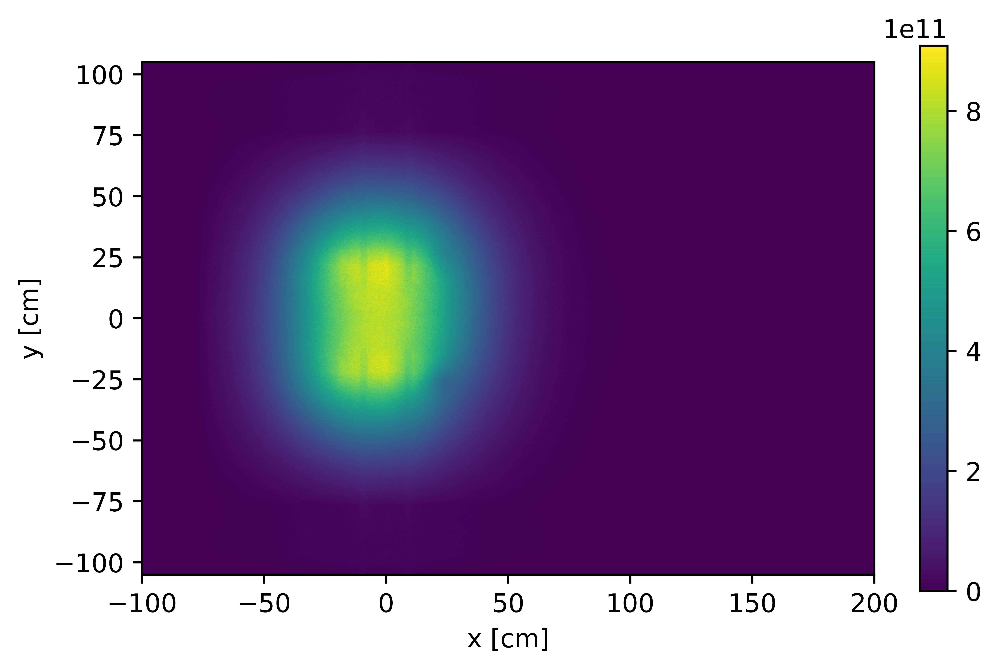

In [7]:
fig = plt.figure(dpi=1000)
plt.subplot()
plt.imshow(normalized_epithermal_flux, origin='lower', extent=[-100, 200, -105, 105])
plt.colorbar(shrink= 0.8)
plt.xlabel('x [cm]')
plt.ylabel('y [cm]')

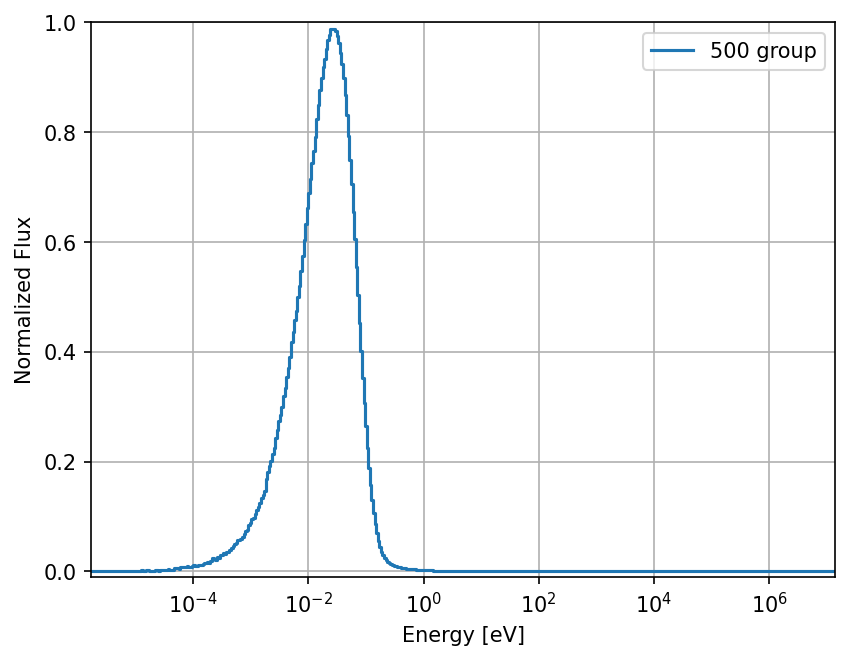

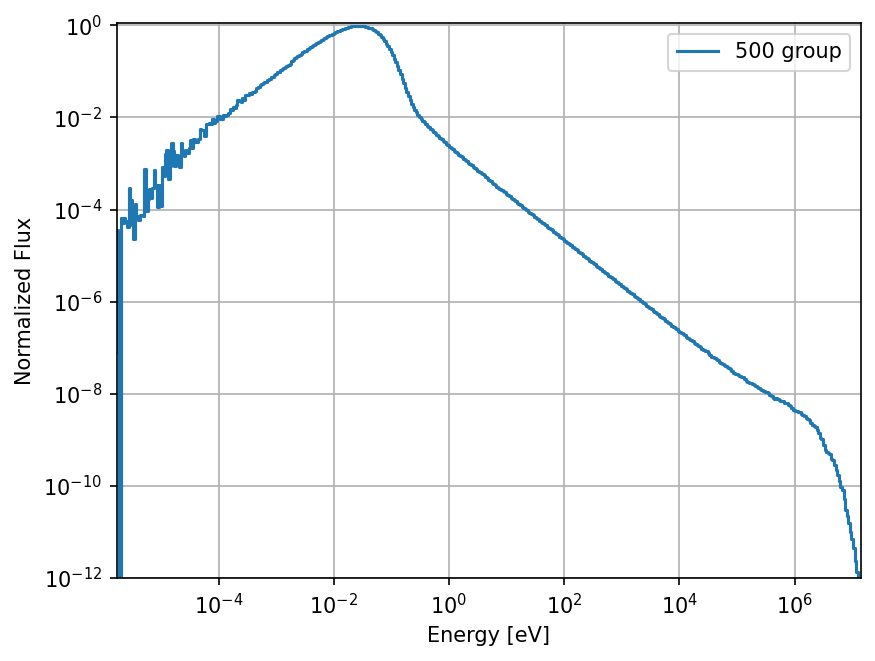

In [83]:
energies = np.logspace(np.log10(1e-6), np.log10(50.0e6), 501)

flux500_mean = energy_spectrum.mean.ravel() / 2300
flux500_unc =  energy_spectrum.std_dev.ravel()

fig, ax = plt.subplots(dpi= 150)
fig_2, ax_2 = plt.subplots(dpi= 150)
ax.step(energies[:-1], flux500_mean/np.diff(energies), where='post', label='500 group')

ax.set_xscale('log')
ax.set_yscale('linear')
ax.set_xlabel('Energy [eV]')
ax.set_ylabel('Normalized Flux')
ax.set_xlim(1.7e-6, 14e6)
ax.set_ylim(-0.01, 1)
ax.grid()
ax.legend()

ax_2.step(energies[:-1], flux500_mean/np.diff(energies), where='post', label='500 group')

ax_2.set_xscale('log')
ax_2.set_yscale('log')
ax_2.set_xlabel('Energy [eV]')
ax_2.set_ylabel('Normalized Flux')
ax_2.set_xlim(1.7e-6, 14e6)
ax_2.set_ylabel('Normalized Flux')
ax_2.set_ylim(10e-13, 1.1)
ax_2.grid()
ax_2.legend()